# ***Import Libraries***




In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_swiss_roll
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
import math


In [2]:
# Sample a batch from the swiss roll
def sample_batch(size, noise=0.5):
    X, y = make_swiss_roll(size, noise=noise)
    print("X_shape: " + str(X.shape))
    print("X: " + str(X))
    print("y_shape: " + str(y.shape))
    print("y: " + str(y))
    X_2d_norm = X[:, [0, 2]]
    print("X_2d_norm.shape" + str(X_2d_norm.shape))
    print("X_2d_norm: " + str(X_2d_norm))
    return X_2d_norm
    

# ***Creating the dataset***

In [3]:
batch_size = 128
# n_datapoints = 5120
# n_datapoints = 1280
n_datapoints = 128*80 # 10240
# n_datapoints = 12800

In [4]:
data = sample_batch(n_datapoints).T # batch size = 128, so taking multiple of that. it would be easier to accumulate data later on
print()
print("data_shape: " + str(data.shape))
print("data: " + str(data))
print()
print(*data)


X_shape: (10240, 3)
X: [[ -2.1552777   -0.1454928  -10.04576055]
 [  0.13440241   9.55590695  -4.73935129]
 [  7.1903937   21.1311233   -8.92870565]
 ...
 [ -8.52135283   0.60283316  -6.75294041]
 [ -9.35840355  18.0120319   -0.63670544]
 [  6.29053555   4.2340795   -9.19299324]]
y_shape: (10240,)
y: [10.75571122  4.88593782 11.67239327 ... 10.04104895  9.53108664
 11.54041641]
X_2d_norm.shape(10240, 2)
X_2d_norm: [[ -2.1552777  -10.04576055]
 [  0.13440241  -4.73935129]
 [  7.1903937   -8.92870565]
 ...
 [ -8.52135283  -6.75294041]
 [ -9.35840355  -0.63670544]
 [  6.29053555  -9.19299324]]

data_shape: (2, 10240)
data: [[ -2.1552777    0.13440241   7.1903937  ...  -8.52135283  -9.35840355
    6.29053555]
 [-10.04576055  -4.73935129  -8.92870565 ...  -6.75294041  -0.63670544
   -9.19299324]]

[-2.1552777   0.13440241  7.1903937  ... -8.52135283 -9.35840355
  6.29053555] [-10.04576055  -4.73935129  -8.92870565 ...  -6.75294041  -0.63670544
  -9.19299324]


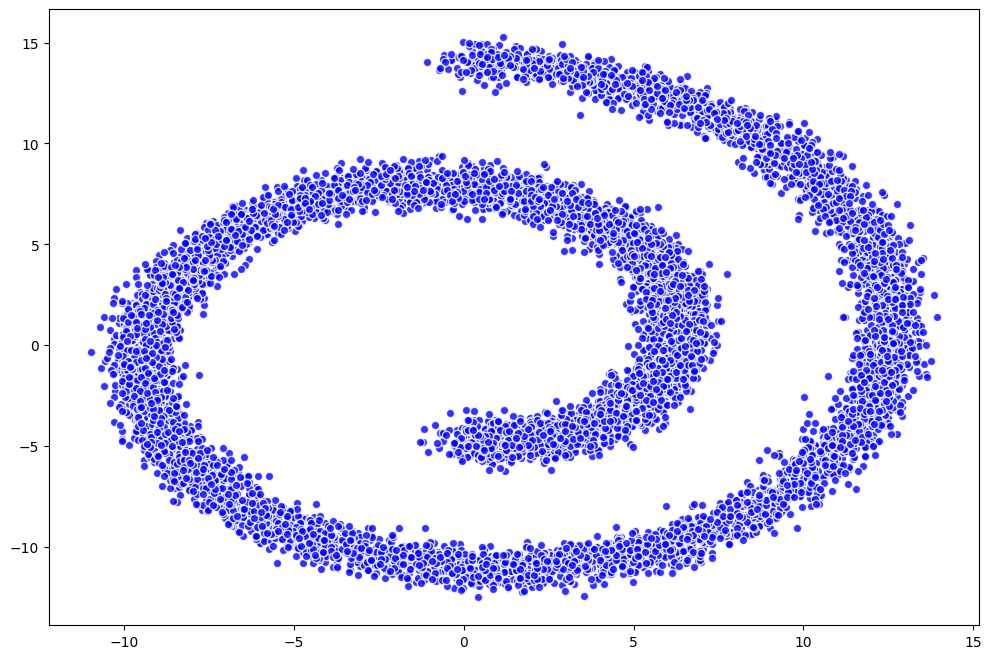

In [5]:
plt.figure(figsize=(12, 8))
plt.scatter(*data, alpha=0.8, color='blue', edgecolor='white');

In [6]:
dataset = torch.Tensor(data.T).float()
print(dataset.size())
print(dataset)

torch.Size([10240, 2])
tensor([[ -2.1553, -10.0458],
        [  0.1344,  -4.7394],
        [  7.1904,  -8.9287],
        ...,
        [ -8.5214,  -6.7529],
        [ -9.3584,  -0.6367],
        [  6.2905,  -9.1930]])


# ***Defining no. of timesteps***

In [7]:
# x0, x1, x2, ..., x99, 100 steps 
n_time_steps = 100


# ***Defining beta schedulers***

In [8]:
def beta_scheduler(schedule='linear', n_timesteps=1000, start=1e-5, end=1e-2):
    if schedule == 'linear':
        betas = torch.linspace(start, end, n_timesteps)
    elif schedule == "quad":
        betas = torch.linspace(start ** 0.5, end ** 0.5, n_time_steps)** 2
    elif schedule == "sigmoid":
        betas = torch.linspace(-6, 6, n_timesteps)
        betas = torch.sigmoid(betas) * (end - start) + start
    elif schedule == "cosine":
        cosine_cons = 5e-3
        timesteps = torch.arange(n_timesteps + 1) / n_timesteps + cosine_cons
        pi_val = math.pi
        alphas = timesteps / (1 + cosine_cons) * pi_val / 2
        alphas = torch.cos(alphas).pow(2)
        alphas = alphas / alphas[0]
        alphas = alphas[1:] / alphas[:-1]
        betas = 1 - alphas
        betas = betas.clamp(max=0.999) # [0, 0.999]
    return betas

# ***Cosine Beta***

In [9]:
betas = beta_scheduler(schedule='cosine', n_timesteps=n_time_steps, start=1e-5, end=1e-2)
print(betas.size())
print(betas)


torch.Size([100])
tensor([4.8864e-04, 9.7692e-04, 1.4657e-03, 1.9551e-03, 2.4449e-03, 2.9359e-03,
        3.4280e-03, 3.9216e-03, 4.4167e-03, 4.9140e-03, 5.4134e-03, 5.9153e-03,
        6.4198e-03, 6.9274e-03, 7.4385e-03, 7.9528e-03, 8.4713e-03, 8.9935e-03,
        9.5204e-03, 1.0052e-02, 1.0589e-02, 1.1131e-02, 1.1679e-02, 1.2234e-02,
        1.2794e-02, 1.3362e-02, 1.3937e-02, 1.4520e-02, 1.5111e-02, 1.5711e-02,
        1.6320e-02, 1.6939e-02, 1.7568e-02, 1.8208e-02, 1.8859e-02, 1.9522e-02,
        2.0198e-02, 2.0888e-02, 2.1592e-02, 2.2311e-02, 2.3045e-02, 2.3797e-02,
        2.4566e-02, 2.5353e-02, 2.6161e-02, 2.6990e-02, 2.7841e-02, 2.8716e-02,
        2.9615e-02, 3.0541e-02, 3.1496e-02, 3.2480e-02, 3.3497e-02, 3.4548e-02,
        3.5635e-02, 3.6761e-02, 3.7928e-02, 3.9140e-02, 4.0400e-02, 4.1711e-02,
        4.3078e-02, 4.4503e-02, 4.5993e-02, 4.7553e-02, 4.9187e-02, 5.0903e-02,
        5.2708e-02, 5.4609e-02, 5.6616e-02, 5.8739e-02, 6.0990e-02, 6.3381e-02,
        6.5927e-02, 6.

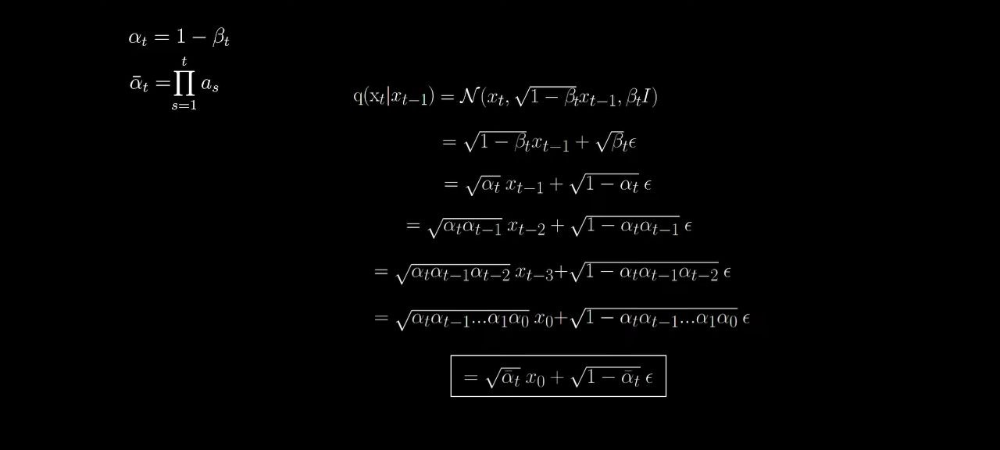

# ***Finding out alpha, ahpha bar etc.***

In [10]:
alphas = 1 - betas
alphas_prod = torch.cumprod(alphas, 0)
alphas_prod_p = torch.cat([torch.tensor([1]).float(), alphas_prod[:-1]], 0) # alpha_bar_t_minus_1
alphas_bar_sqrt = torch.sqrt(alphas_prod)
one_minus_alphas_bar_sqrt = torch.sqrt(1 - alphas_prod)

In [11]:
xx = torch.tensor([1]).float()
print(xx)
yy = alphas_prod[:-1]
print(yy.size())
print(yy)
zz = torch.cat([xx, yy], 0)
print(zz)

tensor([1.])
torch.Size([99])
tensor([9.9951e-01, 9.9853e-01, 9.9707e-01, 9.9512e-01, 9.9269e-01, 9.8977e-01,
        9.8638e-01, 9.8251e-01, 9.7817e-01, 9.7337e-01, 9.6810e-01, 9.6237e-01,
        9.5619e-01, 9.4957e-01, 9.4251e-01, 9.3501e-01, 9.2709e-01, 9.1875e-01,
        9.1000e-01, 9.0086e-01, 8.9132e-01, 8.8140e-01, 8.7110e-01, 8.6045e-01,
        8.4944e-01, 8.3809e-01, 8.2641e-01, 8.1441e-01, 8.0210e-01, 7.8950e-01,
        7.7661e-01, 7.6346e-01, 7.5005e-01, 7.3639e-01, 7.2250e-01, 7.0840e-01,
        6.9409e-01, 6.7959e-01, 6.6492e-01, 6.5008e-01, 6.3510e-01, 6.1999e-01,
        6.0476e-01, 5.8942e-01, 5.7400e-01, 5.5851e-01, 5.4296e-01, 5.2737e-01,
        5.1175e-01, 4.9612e-01, 4.8050e-01, 4.6489e-01, 4.4932e-01, 4.3379e-01,
        4.1834e-01, 4.0296e-01, 3.8767e-01, 3.7250e-01, 3.5745e-01, 3.4254e-01,
        3.2779e-01, 3.1320e-01, 2.9879e-01, 2.8459e-01, 2.7059e-01, 2.5681e-01,
        2.4328e-01, 2.2999e-01, 2.1697e-01, 2.0423e-01, 1.9177e-01, 1.7962e-01,
        1.

In [12]:
print("alphas: " + str(alphas))
print("alphas_prod: " + str(alphas_prod))
print("alphas_prod_p: " + str(alphas_prod_p)) # # alpha_bar_t_minus_1, got from ddpm equation for mean, var
print("alphas_bar_sqrt: " + str(alphas_bar_sqrt))
print("one_minus_alphas_bar_sqrt: " + str(one_minus_alphas_bar_sqrt))

alphas: tensor([0.9995, 0.9990, 0.9985, 0.9980, 0.9976, 0.9971, 0.9966, 0.9961, 0.9956,
        0.9951, 0.9946, 0.9941, 0.9936, 0.9931, 0.9926, 0.9920, 0.9915, 0.9910,
        0.9905, 0.9899, 0.9894, 0.9889, 0.9883, 0.9878, 0.9872, 0.9866, 0.9861,
        0.9855, 0.9849, 0.9843, 0.9837, 0.9831, 0.9824, 0.9818, 0.9811, 0.9805,
        0.9798, 0.9791, 0.9784, 0.9777, 0.9770, 0.9762, 0.9754, 0.9746, 0.9738,
        0.9730, 0.9722, 0.9713, 0.9704, 0.9695, 0.9685, 0.9675, 0.9665, 0.9655,
        0.9644, 0.9632, 0.9621, 0.9609, 0.9596, 0.9583, 0.9569, 0.9555, 0.9540,
        0.9524, 0.9508, 0.9491, 0.9473, 0.9454, 0.9434, 0.9413, 0.9390, 0.9366,
        0.9341, 0.9314, 0.9284, 0.9253, 0.9220, 0.9183, 0.9144, 0.9101, 0.9054,
        0.9002, 0.8945, 0.8882, 0.8811, 0.8732, 0.8641, 0.8538, 0.8419, 0.8279,
        0.8113, 0.7912, 0.7666, 0.7355, 0.6951, 0.6405, 0.5628, 0.4446, 0.2501,
        0.0010])
alphas_prod: tensor([9.9951e-01, 9.9853e-01, 9.9707e-01, 9.9512e-01, 9.9269e-01, 9.8977e-01,
  

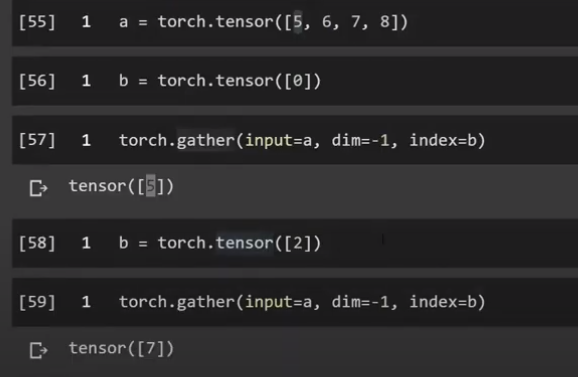

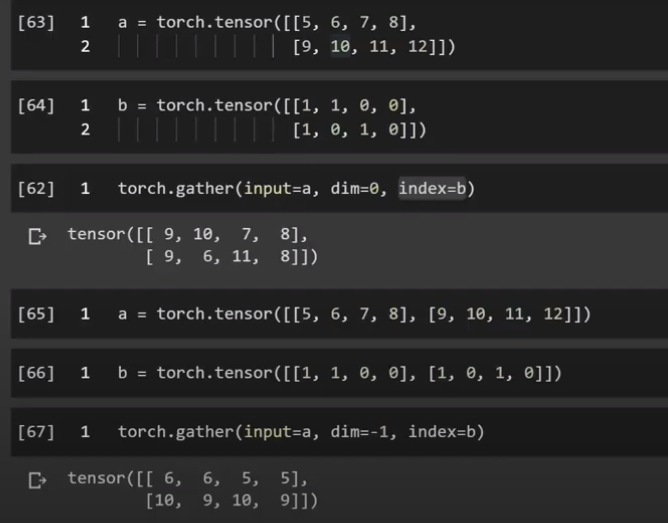

# ***Extract the cumulative product at timestep t and then redimension the input as the dimension of input_2***

In [13]:
# Extracting input at timestamp = t and then reshaping according to the dimesion of x
def extract_and_redimension(input, t, x):
    input_at_t = torch.gather(input, 0, t.to(input.device))
    reshape = [t.shape[0]] + [1] * (len(x.shape) - 1)
    return input_at_t.reshape(*reshape)


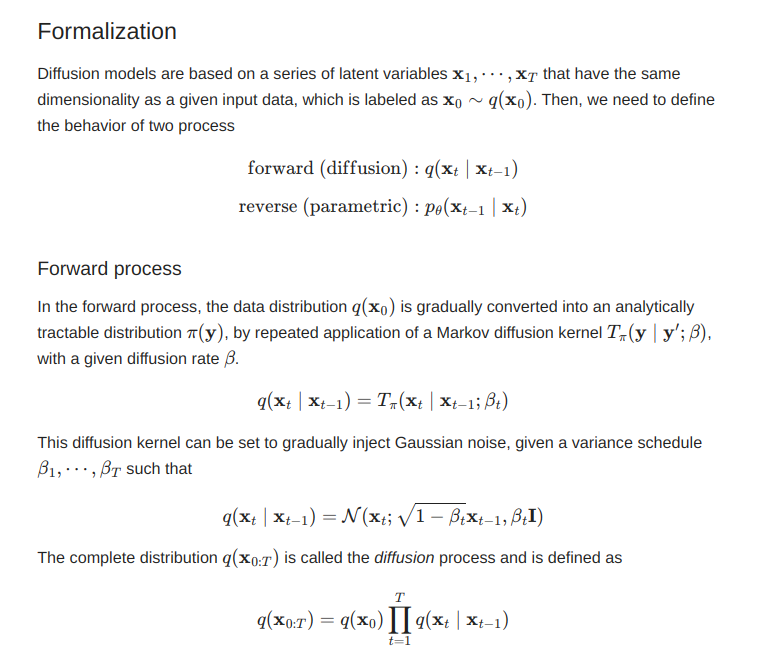

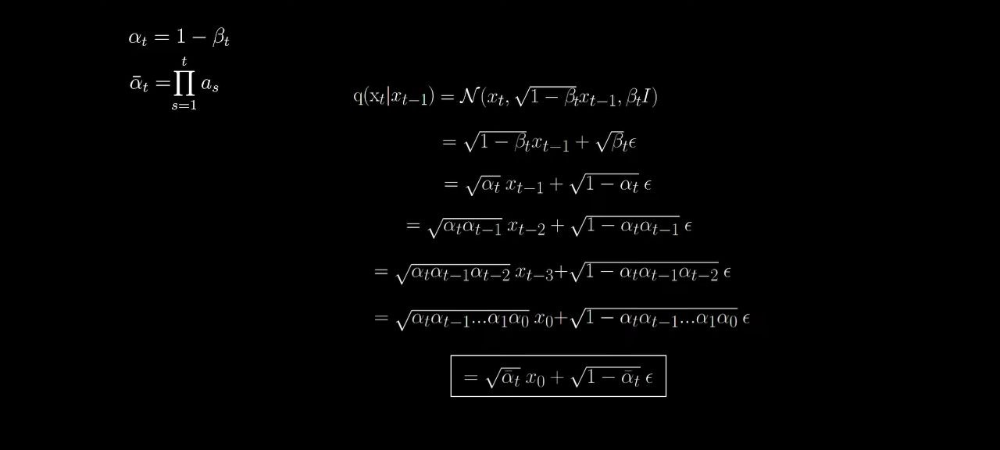

#***Forward Process of adding Noise***

In [14]:
def q_sample(x_0, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_0) # random noise like input data, same dimesnion
    else:
        pass
    # print("alphas_bar_sqrt: " + str(alphas_bar_sqrt))
    alphas_bar_sqrt_cumulative_t = extract_and_redimension(alphas_bar_sqrt, t, x_0) # product of alphas_bar_sqrt upto th term, let's say t=5, we've cumulative product stored in array, so pick the 5th term, and tweak acc to dimension
    # print("alphas_bar_sqrt_cumulative_t: " + str(alphas_bar_sqrt_cumulative_t))
    # print("one_minus_alphas_bar_sqrt: " + str(one_minus_alphas_bar_sqrt))
    one_minus_alphas_bar_sqrt_cumulative_t = extract_and_redimension(one_minus_alphas_bar_sqrt, t, x_0) # product of one_minus_alphas_bar_sqrt upto th term, eg. for t=5, we've cumulative product stored in array, so pick the 5th term, and tweak acc to dimension
    # print("one_minus_alphas_bar_sqrt_cumulative_t: " + str(one_minus_alphas_bar_sqrt_cumulative_t))
    return (alphas_bar_sqrt_cumulative_t * x_0 + one_minus_alphas_bar_sqrt_cumulative_t * noise)


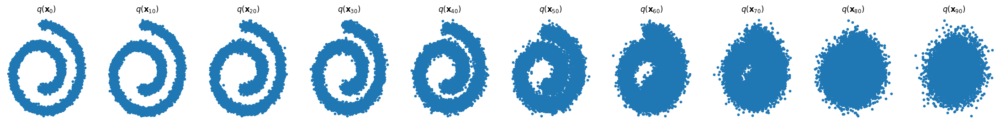

In [15]:
fig, axs = plt.subplots(1, 10, figsize=(28, 3))

for i in range(10):
    time_steps = torch.tensor([i * 10])
    x_i = q_sample(dataset, time_steps)
    axs[i].scatter(x_i[:, 0], x_i[:, 1], s=10);
    axs[i].set_axis_off(); axs[i].set_title('$q(\mathbf{x}_{'+str(i*10)+'})$')

- ***Given x0 and xt, we need to find out the mean and variance. The following fomula achieves this***

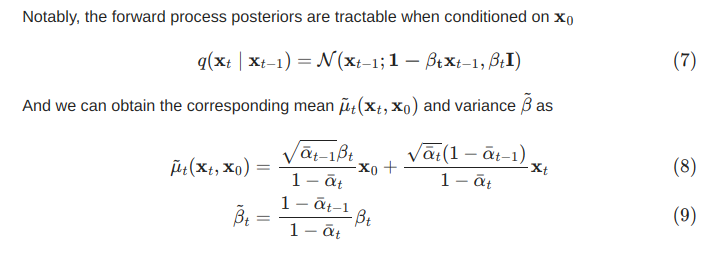

#***Given x0 and xt, find mean and variance from them***

In [16]:
prod_alphas_t_minus_1 = alphas_prod_p
coef_1_num = (torch.sqrt(prod_alphas_t_minus_1) * betas)
coef_1_deno = 1 - alphas_prod
posterior_mean_coef_1 = coef_1_num / coef_1_deno
# posterior_mean_coef_1 = (betas * torch.sqrt(alphas_prod_p) / (1 - alphas_prod))

coef_2_num = torch.sqrt(alphas) * (1 - prod_alphas_t_minus_1)
coef_2_deno = 1 - alphas_prod
posterior_mean_coef_2 = coef_2_num / coef_2_deno
# posterior_mean_coef_2 = ((1 - alphas_prod_p) * torch.sqrt(alphas) / (1 - alphas_prod))

posterior_variance_num = betas * (1 - prod_alphas_t_minus_1)
posterior_variance_deno = (1 - alphas_prod)
posterior_variance = posterior_variance_num / posterior_variance_deno
# posterior_variance = betas * (1 - prod_alphas_t_minus_1) / (1 - alphas_prod)
posterior_log_variance_clipped = torch.log(torch.cat((posterior_variance[1].view(1, 1), posterior_variance[1:].view(-1, 1)), 0)).view(-1)
                                                                                 

In [17]:
# given x0 and xt, find mean and variance from them
def q_posterior_mean_variance(x_0, x_t, t):
    # Calculating Mean
    posterior_mean_coef_1_at_t_redimension = extract_and_redimension(posterior_mean_coef_1, t, x_0)
    posterior_mean_coef_2_at_t_redimension = extract_and_redimension(posterior_mean_coef_2, t, x_0)
    first_term = posterior_mean_coef_1_at_t_redimension * x_0
    second_term = posterior_mean_coef_2_at_t_redimension * x_t
    mean = first_term + second_term

    # Calculating Variance
    var = extract_and_redimension(posterior_log_variance_clipped, t, x_0)
    return mean, var


# ***Defining the models***

In [18]:
import torch.nn.functional as F
class ConditionalLinear(nn.Module):
    def __init__(self, num_in, num_out, n_steps):
        super(ConditionalLinear, self).__init__()
        self.num_out = num_out
        self.lin = nn.Linear(num_in, num_out)
        self.embed = nn.Embedding(n_steps, num_out)
        self.embed.weight.data.uniform_()

    def forward(self, x, y):
        out = self.lin(x)
        gamma = self.embed(y)
        out = gamma.view(-1, self.num_out) * out
        return out
class ConditionalModel(nn.Module):
    def __init__(self, n_steps):
        super(ConditionalModel, self).__init__()
        self.lin1 = ConditionalLinear(2, 128, n_steps)
        self.lin2 = ConditionalLinear(128, 128, n_steps)
        self.lin3 = nn.Linear(128, 4)
    
    def forward(self, x, y):
        x = F.softplus(self.lin1(x, y))
        x = F.softplus(self.lin2(x, y))
        return self.lin3(x)


#***Reverse Process***

In [19]:
# Given xt and t find out the mean and variance calculated by model
def p_mean_variance(model, x, t):
    # Go through model
    model_output = model(x, t)
    # Extract the mean and variance
    mean, log_var = torch.split(model_output, 2, dim=-1)
    noise = mean + log_var
    return mean, log_var

# Given t and xt, finding out xt-t = xt-t
def p_sample(model, x, t):
    t_tensor = torch.tensor(t)
    mean, log_var = p_mean_variance(model, x, t_tensor)
    actual_var = torch.exp(0.5 * log_var)
    rand_noise = torch.randn_like(x)
    sample = mean + actual_var * rand_noise
    return (sample) 

def p_sample_loop(model, shape):
    random_noise = torch.randn(shape)
    # cur_data = [random_noise]
    reverse_process_data_at_diff_time = [random_noise]
    for i in range(n_time_steps-1, -1, -1):
        random_noise = p_sample(model, random_noise, i)
        reverse_process_data_at_diff_time.append(random_noise)
        # out_x = p_sample(model, cur_data, i)
        # x_seq.append(out_x)
    return reverse_process_data_at_diff_time

# ***Formulas kl-div and entropy***

In [20]:
def kl_divergence(mean1, logvar1, mean2, logvar2):
    kl = 0.5 * (-1.0 + logvar2 - logvar1 + torch.exp(logvar1 - logvar2) + ((mean1 - mean2) ** 2) * torch.exp(-logvar2))
    return kl

def entropy(val):
    return (0.5 * (1 + np.log(2. * np.pi))) + 0.5 * np.log(val)

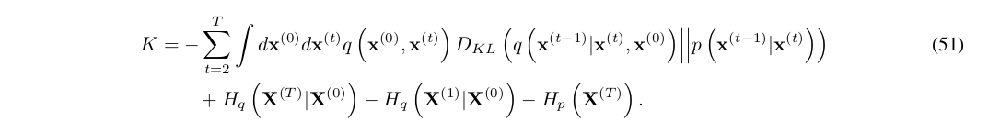

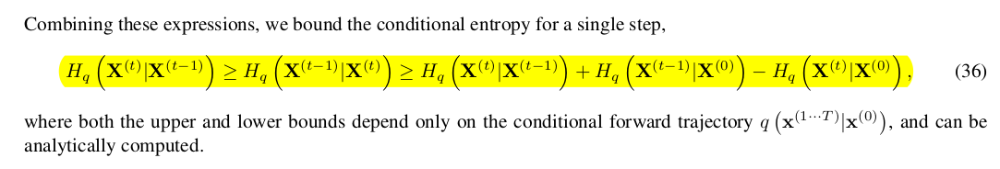

# ***Defining Loss function***

In [21]:
def calculate_loss(true_mean, true_var, model_mean, model_var):
    # the KL divergence between model transition and posterior from data
    KL = kl_divergence(true_mean, true_var, model_mean, model_var).float()
    
    # conditional entropies H_q(x^T|x^0) and H_q(x^1|x^0)
    H_start = entropy(betas[0].float())
    H_start = H_start.float()
    one_minus_exp_sum_of_log_alphas = 1. - torch.exp(torch.sum(torch.log(alphas))).float()
    H_end = entropy(one_minus_exp_sum_of_log_alphas.float())
    H_end = H_end.float()
    H_prior = entropy(torch.tensor([1.]))
    H_prior = H_prior.float()
    
    # Actual Loss Function
    negL_bound = n_time_steps * KL + H_start - H_end + H_prior

    # the negL_bound if this was an isotropic Gaussian model of the data
    negL_gauss = entropy(torch.tensor([1.])).float()
    negL_diff = negL_bound - negL_gauss
    L_diff_bits = negL_diff / np.log(2.)
    L_diff_bits_avg = L_diff_bits.mean()
    return L_diff_bits_avg

def loss_likelihood_bound(model, x_0):
    batch_size = x_0.shape[0]
    # Select a random step for each example
    t = torch.randint(0, n_time_steps, size=(batch_size // 2 + 1,))
    t = torch.cat([t, n_time_steps - t - 1], dim=0)[:batch_size].long()
    # t = torch.randint(0, n_time_steps, size=(batch_size,)).long()

    # Perform diffusion for step t, x0 -> xt
    x_t = q_sample(x_0, t)

    # print("x_t: " + str(x_t))

    model_output = model(x_t, t)
    # print("model_output: " + str(model_output))

    mean, log_var = torch.split(model_output, 2, dim=-1)
    # print("mean: " + str(mean))
    # print("log_var: " + str(log_var))

    actual_var = torch.exp(0.5 * log_var)
    rand_noise = torch.randn_like(x_0)
    sample = mean + actual_var * rand_noise
    # print("sample: " + str(sample))

    total_loss = F.mse_loss(sample, x_t)

    # Compute the true mean and variance
    # true_mean, true_var = q_posterior_mean_variance(x_0, x_t, t)
    # # Infer the mean and variance with our model
    # model_mean, model_var = p_mean_variance(model, x_t, t)
    # # Compute the loss
    # total_loss = calculate_loss(true_mean, true_var, model_mean, model_var)

    # return total_loss and data at t=t i.e. xt
    return total_loss, x_t

In [22]:
# x_t = q_sample(x_0, t)
# x_recon = model(x_t, t)
# return F.mse_loss(x_recon, noise)

# ***Defining function for plotting epochs vs Loss***

In [23]:
import matplotlib.pyplot as plt

def my_plot(epochs, loss, x_label, y_label, title):
    plt.plot(epochs, loss)

    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.show()

# ***ADAM optimizer with lr = 1e-3 MSE LOSS***

In [24]:
dataset = torch.tensor(data.T).float()
model = ConditionalModel(n_time_steps)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
batch_size = 128
n_epochs = 20001

Loss at epoch 0: 0.14619438350200653
Loss at epoch 1000: 0.0005951789789833128
Loss at epoch 2000: 4.308039206080139e-05
Loss at epoch 3000: 0.00024833143106661737
Loss at epoch 4000: 0.00039288096013478935
Loss at epoch 5000: 7.839599857106805e-05
Loss at epoch 6000: 5.021893957746215e-05
Loss at epoch 7000: 8.433478069491684e-05
Loss at epoch 8000: 0.00015528465155512094
Loss at epoch 9000: 3.2902589737204835e-05
Loss at epoch 10000: 0.0002639073063619435


<ipython-input-25-182e72e58e2f>:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 8))


Loss at epoch 11000: 4.905739115201868e-05
Loss at epoch 12000: 9.575880540069193e-05
Loss at epoch 13000: 0.0004889897536486387
Loss at epoch 14000: 0.00012994110875297338
Loss at epoch 15000: 6.0740625485777855e-05
Loss at epoch 16000: 0.0001254578382940963
Loss at epoch 17000: 7.285815081559122e-05
Loss at epoch 18000: 1.7845144611783326e-05
Loss at epoch 19000: 0.00014228680811356753
Loss at epoch 20000: 9.345629223389551e-05


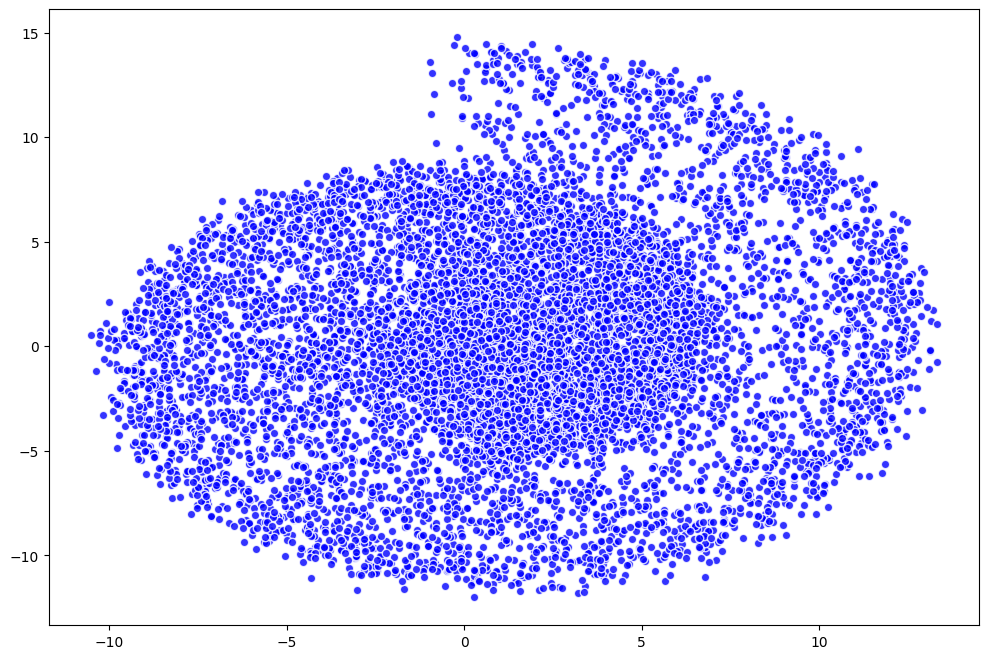

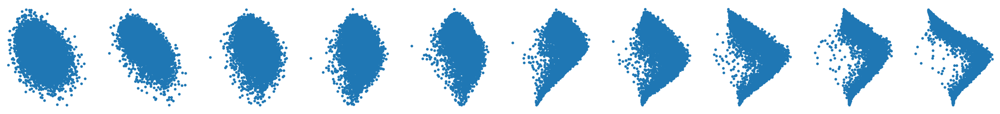

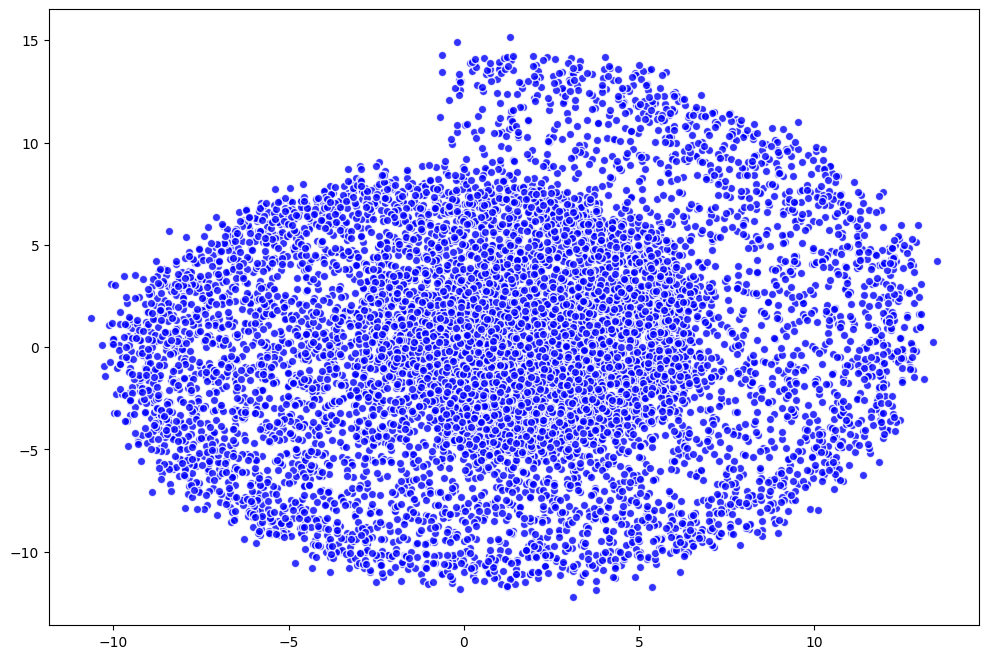

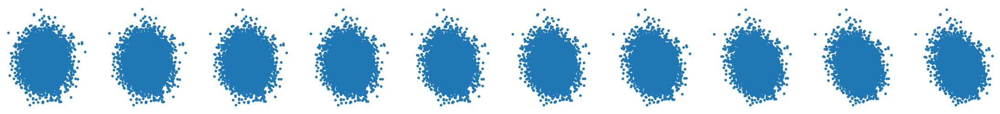

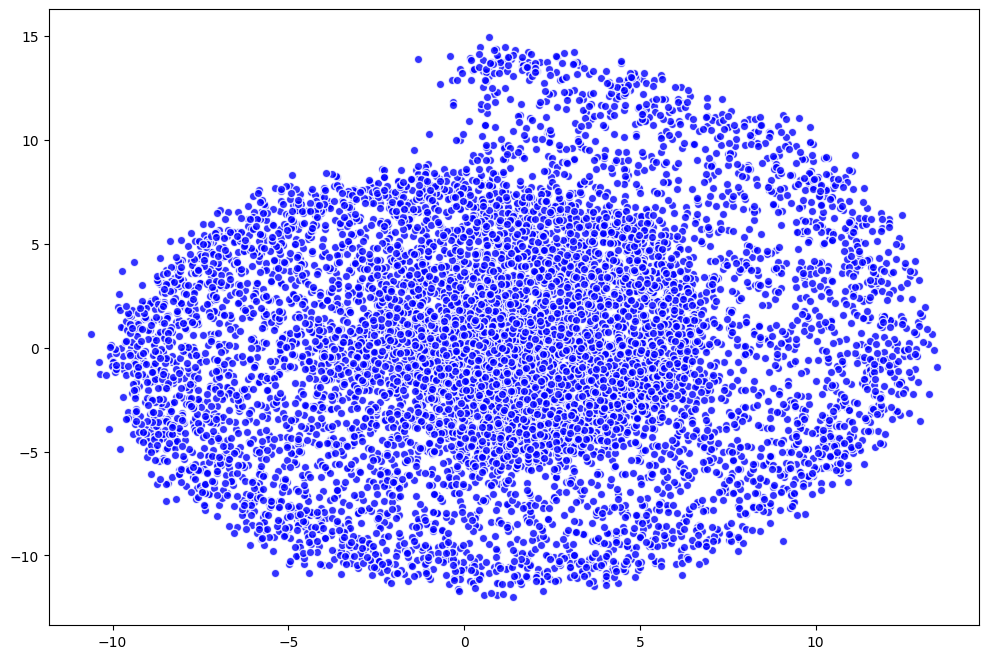

...

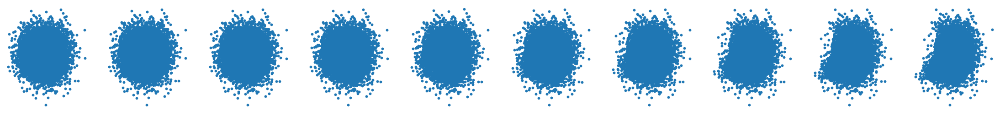

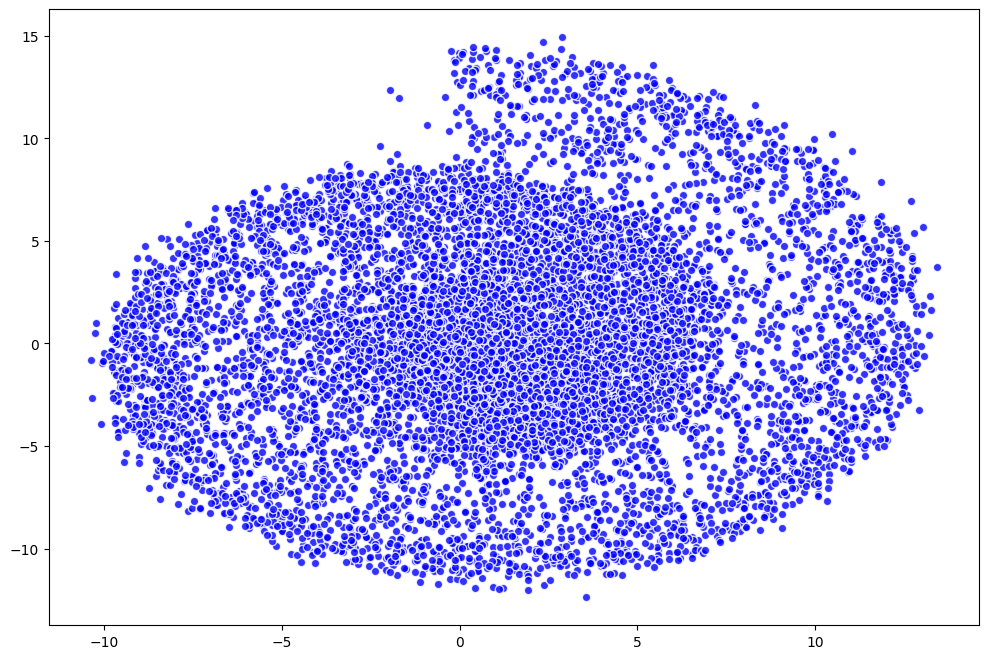

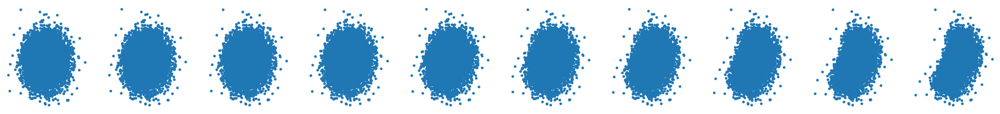

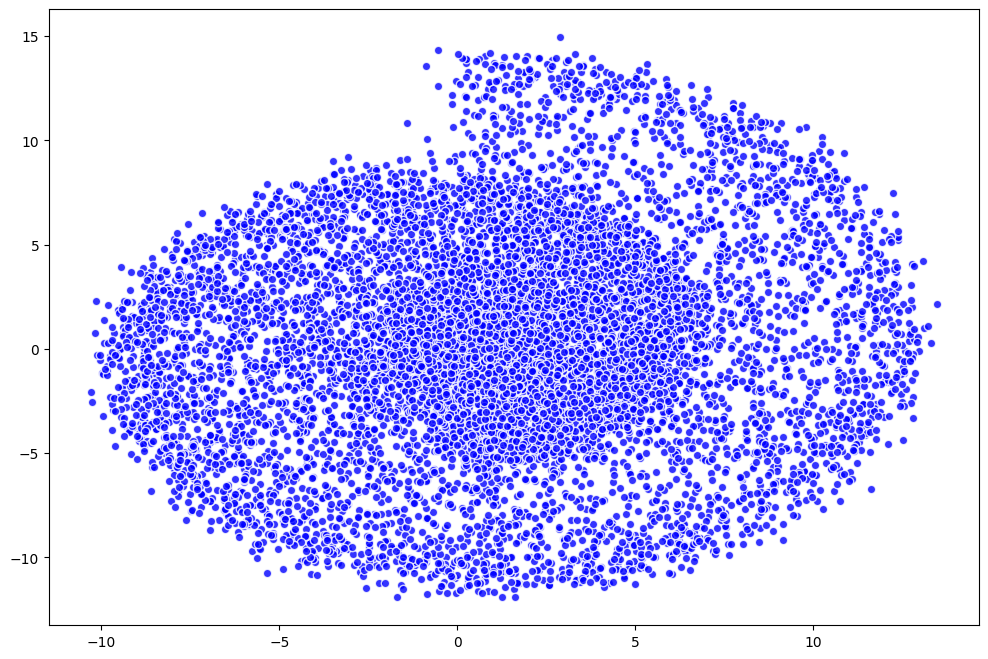

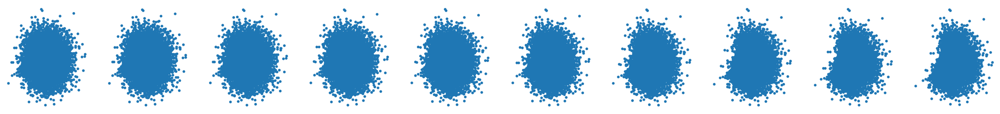

In [25]:
# 1 hr 17 mins to run

loss_vals=  []
for t in range(n_epochs):
    # plt.figure(figsize=(12, 8))
    # plt.scatter(*dataset.T, alpha=0.8, color='blue', edgecolor='white');
    noisy_data = torch.empty(0,2)
    epoch_loss= []
    # X is a torch Variable
    permutation = torch.randperm(dataset.size()[0])
    for i in range(0, dataset.size()[0], batch_size):
        # Retrieve current batch
        indices = permutation[i:i+batch_size]
        batch_x = dataset[indices]
        # Compute the loss.
        loss, x_t = loss_likelihood_bound(model, batch_x)
        noisy_data = torch.cat((noisy_data, x_t), 0)
        # Before the backward pass, zero all of the network gradients
        optimizer.zero_grad()
        # Backward pass: compute gradient of the loss with respect to parameters
        loss.backward()
        epoch_loss.append(loss.item())
        # Perform gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.)
        # Calling the step function to update the parameters
        optimizer.step()
    if (t % 100 == 0):
        loss_vals.append(sum(epoch_loss)/len(epoch_loss))
    # Print loss
    if (t % 1000 == 0):
        print("Loss at epoch " + str(t) + ": " + str(loss.item()))
        plt.figure(figsize=(12, 8))
        plt.scatter(*noisy_data.T, alpha=0.8, color='blue', edgecolor='white');
        x_seq = p_sample_loop(model, dataset.shape)
        fig, axs = plt.subplots(1, 10, figsize=(28, 3))
        for i in range(1, 11):
            cur_x = x_seq[i * 10].detach()
            axs[i-1].scatter(cur_x[:, 0], cur_x[:, 1], s=10);
            axs[i-1].set_axis_off(); # axs[i-1].set_title('$q(\mathbf{x}_{'+str(i*100)+'})$')

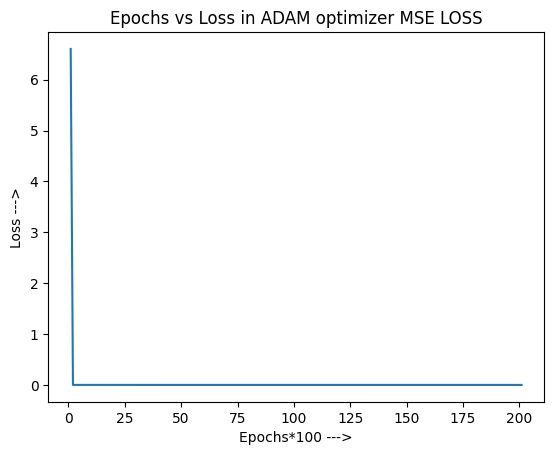

In [26]:
x_label = "Epochs*100 --->"
y_label = "Loss --->"
title = "Epochs vs Loss in ADAM optimizer MSE LOSS"
my_plot(np.linspace(1, len(loss_vals), len(loss_vals)).astype(int), loss_vals, x_label, y_label, title)